In [1]:
using Revise
includet("../scripts/ned_ca_s1_stats.jl")
using GLMakie
using WGLMakie
using CairoMakie
using JLD2

Precompiling packages...
  15725.4 ms  ✓ NonEqDigits
  1 dependency successfully precompiled in 19 seconds. 342 already precompiled.


# Exploration

In [261]:
xx = filter(ca_iseq, ca_ucodes_bydeg())
[(c, cacode_to_Ks(c)) for c in sort(xx; by=ca_numenzymes)]

9-element Vector{Tuple{Int64, Tuple{Matrix{Int64}, Matrix{Int64}}}}:
 (204, ([0 0; 0 0], [0 0; 0 0]))
 (108, ([0 0; 0 1], [0 0; 0 1]))
 (156, ([0 0; 1 0], [0 0; 1 0]))
 (105, ([1 0; 0 1], [1 0; 0 1]))
 (150, ([0 1; 1 0], [0 1; 1 0]))
 (60, ([0 0; 1 1], [0 0; 1 1]))
 (54, ([0 1; 1 1], [0 1; 1 1]))
 (57, ([1 0; 1 1], [1 0; 1 1]))
 (51, ([1 1; 1 1], [1 1; 1 1]))

## Working on structure rules summary

### Identifying subrules

In [622]:
Ks_to_cacode(
    [1 0; 1 1],
    [0 0; 0 1]
)

125

In [636]:
9 in ca_ucodes_f1()

true

In [635]:
Ks_to_cacode(caKssym_F(125)...)

9

In [623]:
find_eq_parent(125)

57

In [317]:
xx = filter(c -> find_eq_parent_ucode(c) == 60, 0:255);

In [417]:
xx = filter(c -> find_eq_parent_ucode(c) == 108, ca_ucodes_bydeg())

3-element Vector{Any}:
  76
 200
 108

In [419]:
[
    (c, cacode_to_Ks(c), ca_numenzymes(c))
    for c in sort(xx; by=ca_numenzymes)
    # if (ca_numenzymes(c) == 8) && !(c in ())
]

3-element Vector{Tuple{Int64, Tuple{Matrix{Int64}, Matrix{Int64}}, Int64}}:
 (76, ([0 0; 0 0], [0 0; 0 1]), 1)
 (200, ([0 0; 0 0], [1 0; 0 0]), 1)
 (108, ([0 0; 0 1], [0 0; 0 1]), 2)

In [443]:
ca_test_ucodes_f1()

true

In [348]:
display(GLMakie.Screen(), ca_ned_sym_graphplot())

GLMakie.Screen(...)

In [706]:
xx = filter(c -> find_eq_parent(c) == 60, ca_ucodes_f1())
yy = [
    (c, cacode_to_Ks(c), ca_numenzymes(c))
    for c in sort(xx; by=ca_numenzymes)
    if (ca_numenzymes(c) == 3) && !(c in ())
]
sort!(yy; by=x->sum(x[2][1]))
yy

4-element Vector{Tuple{Int64, Tuple{Matrix{Int64}, Matrix{Int64}}, Int64}}:
 (44, ([0 0; 0 1], [0 0; 1 1]), 3)
 (28, ([0 0; 1 0], [0 0; 1 1]), 3)
 (124, ([0 0; 1 1], [0 0; 0 1]), 3)
 (188, ([0 0; 1 1], [0 0; 1 0]), 3)

### Plotting

In [840]:
# Eq rule setup
rule = 51
N = 8
ned = make_ca_ned(N, rule)
faa = plotgm(ned;
    # layout=Spring(dim=3),
    layout=Spectral(dim=3),
    # flabels=true,
    # fnlabels=false,
    # get_ac_coloring_kwargs(ned)...
    e_colorbar=false
)
GLMakie.closeall()
display(GLMakie.Screen(), faa)
# faa

K01 = [1 1; 1 1]
K10 = [1 1; 1 1]


GLMakie.Screen(...)

In [1071]:
autofname = datadir("ma_code_summary", (@sprintf "r%d_N%d.png" rule N))
save(datadir(autofname), faa.figure;
    update=false,
    # size=(500, 500)
)

CairoMakie.Screen{IMAGE}


In [1070]:
# Non-eq rule setup (looking for acs)
rule = 90
N = 6
ned = make_ca_ned(N, rule)
faa = plotgm(ned;
    # layout=Spring(dim=3),
    layout=Spectral(dim=2),
    edge_plottype=:linesegments,
    flabels=true,
    # fnlabels=false,
    get_ac_coloring_kwargs(ned)...,
    e_colorbar=false,
    roffset_devs=0.004
)
GLMakie.closeall()
display(GLMakie.Screen(), faa)
# faa

K01 = [0 1; 1 0]
K10 = [1 0; 0 1]


GLMakie.Screen(...)

In [878]:
faa = plotcgm(ned;
    layout=Spring(dim=3),
    ss=supersteadystate(ned)
)
display(GLMakie.Screen(), faa.figure)

GLMakie.Screen(...)

## Exploration 1

In [2]:
filter(ca_iseq, 0:255)

16-element Vector{Int64}:
  51
  54
  57
  60
  99
 102
 105
 108
 147
 150
 153
 156
 195
 198
 201
 204

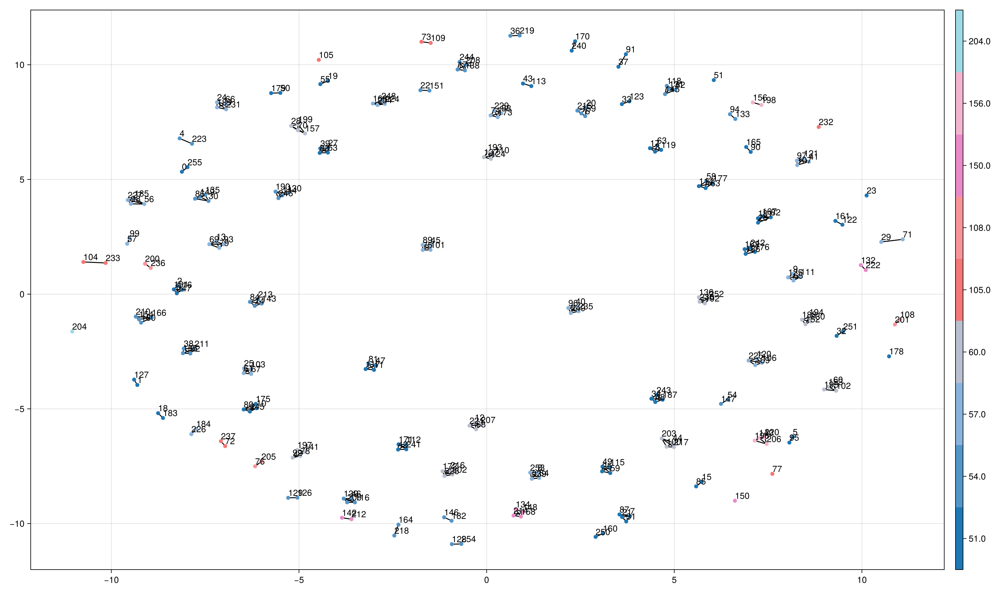

In [3]:
cs = 0:255
g = ca_ned_sym_graph()

# xxs = (sum ∘ find_eq_parent_K).(cs)
# xxs = find_eq_parent.(cs)
xxs = find_eq_parent_ucode.(cs)

fap = graphplot(g;
    nlabels=string.(cs),
    node_color=xxs,
    node_attr=(; colormap=Categorical(:tab20))
)
Colorbar(fap.figure[1,2], get_node_plot(fap.plot))

display(GLMakie.Screen(), fap.figure)

fap.figure

In [4]:
xx = map(x->x .- 1, connected_components(g))
xxps = [find_eq_parent_ucode(x[1]) for x in xx]
unique(xxps)

9-element Vector{Int64}:
  51
  54
  57
  60
 105
 108
 150
 156
 204

In [5]:
cacode_to_Ks(132)

([0 0; 0 0], [0 1; 1 0])

In [6]:
xx[xxps .== 150]

4-element Vector{Vector{Int64}}:
 [132, 222]
 [134, 148, 158, 214]
 [142, 212]
 [150]

In [7]:
xx = filter(c -> find_eq_parent(c) == 60, 0:255)
yy = ca_numenzymes.(xx)
sp = sortperm(yy)
collect(zip(xx[sp], yy[sp]))

9-element Vector{Tuple{Int64, Int64}}:
 (12, 2)
 (92, 2)
 (172, 2)
 (252, 2)
 (28, 3)
 (44, 3)
 (124, 3)
 (188, 3)
 (60, 4)

## All rules summaries

In [306]:
full_code_label(76)

"Rule 76 (108,h)"

In [1036]:
fcodes = filter(c->ca_numenzymes(c)==3, ca_ucodes_bydeg())
xx = [(c, ca_symclass(c), ca_iseq(c), cacode_to_Ks(c), find_eq_parent(c), find_eq_parent_ucode(c)) for c in fcodes]
sort(xx; by=x->x[end] - (x[3] ? 1000 : 0))

17-element Vector{Tuple{Int64, Symbol, Bool, Tuple{Matrix{Int64}, Matrix{Int64}}, Int64, Int64}}:
 (4, :h, 0, ([0 0; 0 0], [0 1; 1 1]), 54, 54)
 (94, :h, 0, ([0 1; 1 0], [0 0; 0 1]), 54, 54)
 (128, :h, 0, ([0 0; 0 0], [1 1; 1 0]), 147, 54)
 (164, :h, 0, ([0 0; 0 1], [0 1; 1 0]), 54, 54)
 (14, :none, 0, ([0 1; 0 0], [0 0; 1 1]), 54, 54)
 (138, :none, 0, ([0 1; 0 0], [1 0; 1 0]), 147, 54)
 (8, :none, 0, ([0 0; 0 0], [1 0; 1 1]), 57, 57)
 (13, :none, 0, ([1 0; 0 0], [0 0; 1 1]), 57, 57)
 (74, :none, 0, ([0 1; 0 0], [1 0; 0 1]), 99, 57)
 (168, :none, 0, ([0 0; 0 1], [1 0; 1 0]), 57, 57)
 (28, :none, 0, ([0 0; 1 0], [0 0; 1 1]), 60, 60)
 (44, :none, 0, ([0 0; 0 1], [0 0; 1 1]), 60, 60)
 (110, :none, 0, ([0 1; 0 1], [0 0; 0 1]), 102, 60)
 (152, :none, 0, ([0 0; 1 0], [1 0; 1 0]), 153, 60)
 (73, :h, 0, ([1 0; 0 0], [1 0; 0 1]), 105, 105)
 (104, :h, 0, ([0 0; 0 1], [1 0; 0 1]), 105, 105)
 (134, :none, 0, ([0 1; 0 0], [0 1; 1 0]), 150, 150)

K01 = [0 0; 1 1]
K10 = [1 0; 1 0]


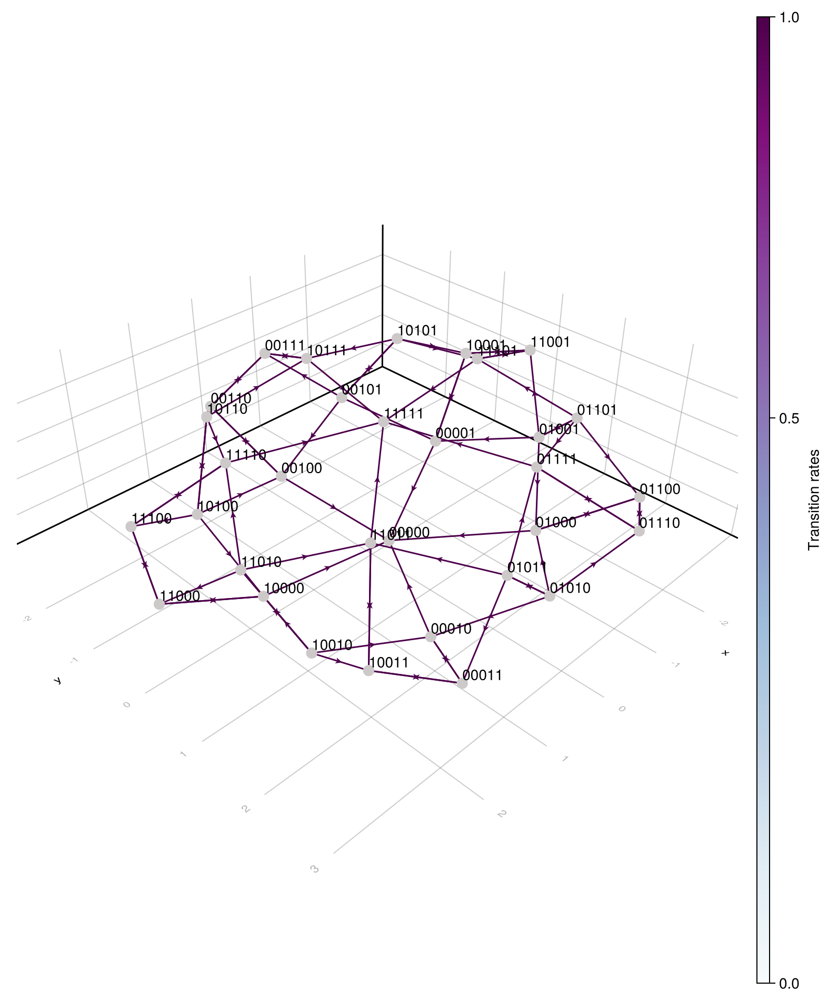

In [1047]:
ned = make_ca_ned(5, 184)
faa = plotgm(ned;
    layout=Spring(dim=3),
    # layout=Spectral(dim=3),
    # flabels=true,
    # fnlabels=false,
    # get_ac_coloring_kwargs(ned)...
)
display(GLMakie.Screen(), faa)
faa

In [983]:
itostate(64, ned)

6-element Vector{Int64}:
 1
 1
 1
 1
 1
 1

In [982]:
attracting_components(graph(ned))

2-element Vector{Vector{Int64}}:
 [1]
 [64]

## Make enzyme removing hierarchy

In [279]:
g = SimpleDiGraph(256)
for c in 0:255
    K01, K10 = cacode_to_Ks(c)

    # K01
    for ci in findall(!iszero, K01)
        cK01 = copy(K01)
        cK01[ci] = 0
        new_code = Ks_to_cacode(cK01, K10)
        add_edge!(g, c+1, new_code+1)
    end
    # K10
    for ci in findall(!iszero, K10)
        cK10 = copy(K10)
        cK10[ci] = 0
        new_code = Ks_to_cacode(K01, cK10)
        add_edge!(g, c+1, new_code+1)
    end

end

In [280]:
neighbors(g, 109)

2-element Vector{Int64}:
  77
 237

In [281]:
neighborhood(g, 109, 1)

3-element Vector{Int64}:
 109
  77
 237

In [284]:
using Graphs.Experimental

In [287]:
unique(Graphs.Experimental.Traversals.distances(g, 109))

4-element Vector{Int64}:
 9223372036854775807
                   1
                   0
                   2

In [299]:
p = Graphs.Experimental.Traversals.tree(g, 52, Graphs.Experimental.Traversals.BFS())

{256, 255} directed simple Int64 graph

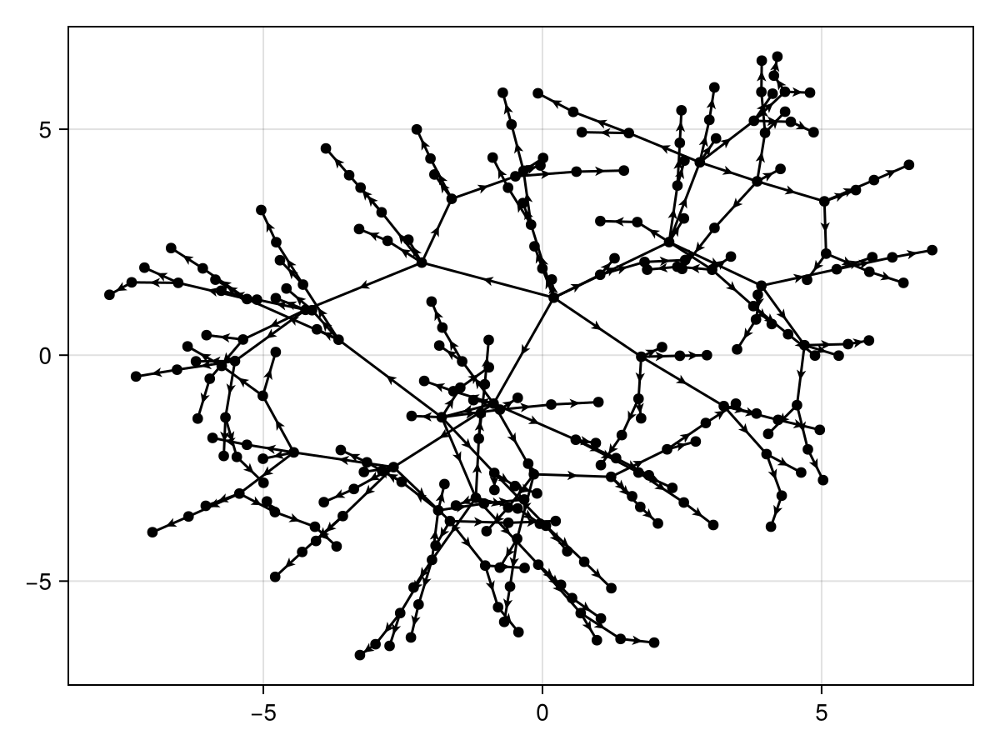

In [300]:
graphplot(p)

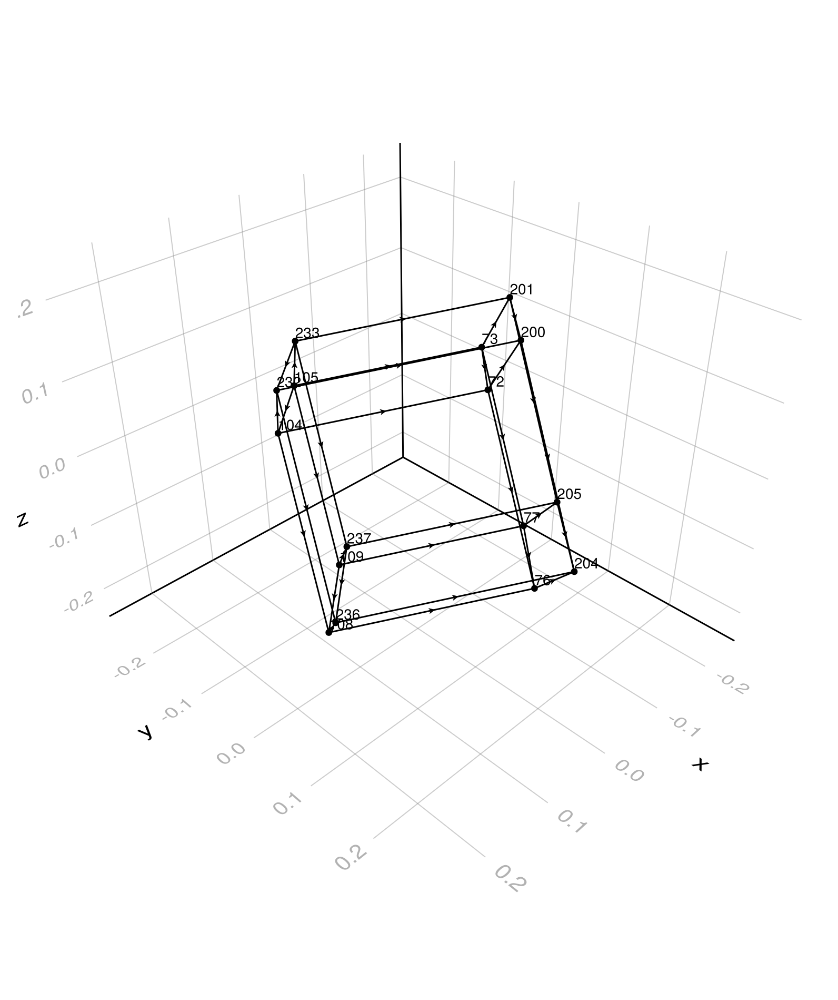

In [278]:
# xx = findall(x->x <= 2, ca_numenzymes.(0:255))
# xx = findall(x->x in ca_ucodes_bydeg(), 0:255)
xx = neighborhood(g, 1+105, 4)
sg = induced_subgraph(g, xx)[1]
scs = (0:255)[xx]

fap = graphplot(sg;
    # layout=Spring(dim=3),
    layout=Spectral(),
    nlabels=string.(scs),
    # node_color=xxs,
    # node_attr=(; colormap=Categorical(:tab20))
)
# Colorbar(fap.figure[1,2], get_node_plot(fap.plot))

display(GLMakie.Screen(), fap.figure)

fap.figure

In [195]:
K01 = [0 1; 1 0]

2×2 Matrix{Int64}:
 0  1
 1  0

In [197]:
findall(!iszero, K01)

2-element Vector{CartesianIndex{2}}:
 CartesianIndex(2, 1)
 CartesianIndex(1, 2)

# Build/load the df

In [2]:
# df = make_s1_stats_df(3:10)
df = load_object("../data/ned_ca/s1_stats15.jld2");
# save_object(datadir("ned_ca", "s1_stats_temp.jld2"), df)

In [3]:
df.eqp_code = find_eq_parent_ucode.(df.code);

In [4]:
describe(df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,code,75.3636,0,55.0,232,0,Int64
2,N,9.0,3,9.0,15,0,Int64
3,numstates,5040.62,8,512.0,32768,0,Int64
4,phi,0.348848,3.05176e-5,0.09375,1.0,0,Float64
5,Nac,123.954,1,2.0,32768,0,Int64
6,Nsingle,112.96,0,1.0,32768,0,Int64
7,Neq,10.7308,0,0.0,3246,0,Int64
8,Nneq,0.263112,0,0.0,7,0,Int64
9,Neqcyc,0.575175,0,0.0,180,0,Int64


# Exploratory plots

In [5]:
# make a selection of the df that is then plotted below
# sdf =  df[2 .<= ca_numenzymes.(df.code) .<= 4,:];
sdf =  df[ca_numenzymes.(df.code) .== 3,:];
# sdf = df;

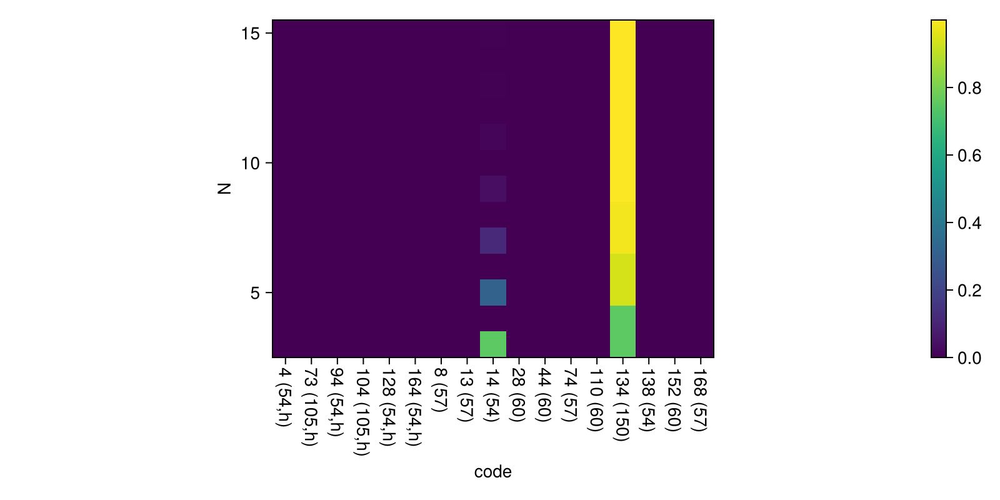

In [6]:
codes = unique(sdf.code)
code_i = map(c->findfirst(x->x==c, codes), sdf.code)

fig = Figure(size=(800, 400))
ax = Axis(fig[1,1], aspect=DataAspect())

# plot = scatter!(ax, code_i, sdf.N; color=sdf.phi, marker=:rect, markersize=20)
plot = heatmap!(ax, code_i, sdf.N, sdf.Kneq ./ sdf.numstates)
Colorbar(fig[1,2], plot)

ax.ylabel = "N"
ax.xlabel = "code"
ax.xticks = (1:length(codes), full_code_label.(codes; short=true))
ax.xticklabelrotation = -pi/2

fig

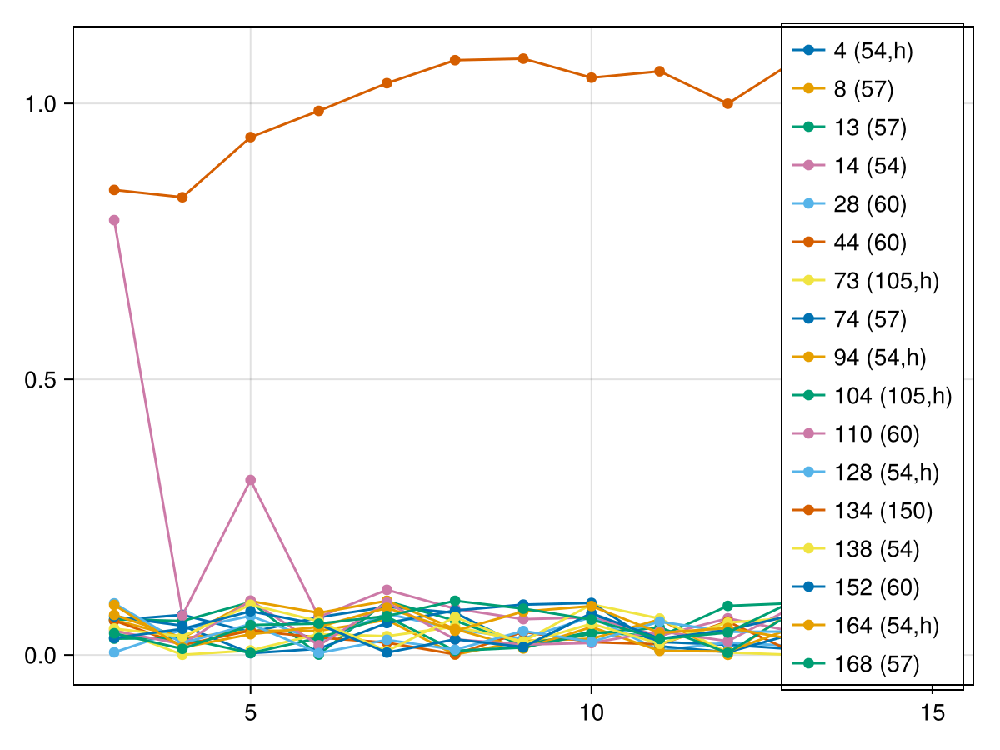

In [7]:
fig = Figure()
ax = Axis(fig[1,1];
    # yscale=Makie.pseudolog10
)
for gdf in groupby(sdf, :code)
    code = gdf.code[1]
    scatterlines!(ax, gdf.N, (gdf.Kneq ./ gdf.numstates) .+ 0.1.*rand(length(gdf.Kneq)); label=full_code_label(code; short=true))
    # scatterlines!(ax, gdf.N, gdf.Nsingle ./ gdf.Nac; label=full_code_label(code; short=true))
end
axislegend(ax; position=:rc)
fig

In [8]:
display(GLMakie.Screen(), fap)

LoadError: UndefVarError: `fap` not defined

K01 = [0 1; 0 0]
K10 = [0 0; 1 1]


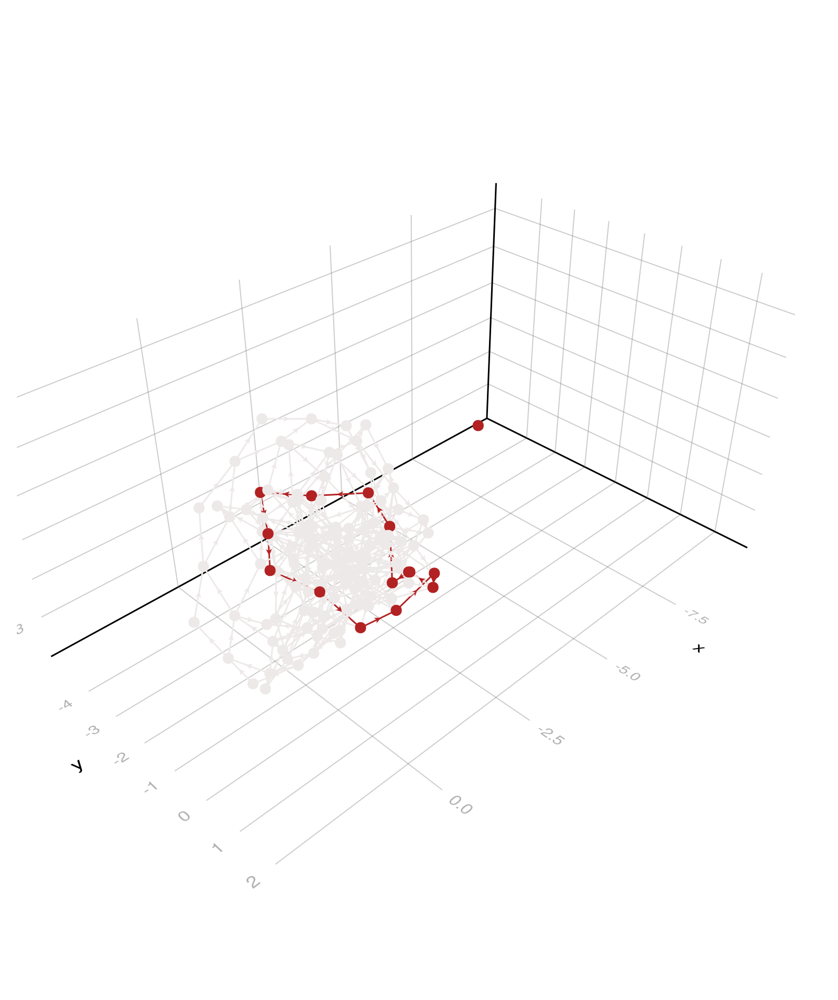

In [9]:
ned = make_ca_ned(7, 14)
faa = plotgm(ned;
    layout=Spring(dim=3),
    get_ac_coloring_kwargs(ned)...
)
display(GLMakie.Screen(), faa)
faa

# Everything plot

In [10]:
eqp_order = [204, 108, 156, 105, 150, 60, 54, 57, 51]
function code_eqp_sortby(c)
    eqp = find_eq_parent_ucode(c)
    findfirst(x->x==eqp, eqp_order)
end
function code_sortby2(c)
    eqp = find_eq_parent_ucode(c)
    eqp_i = findfirst(x->x==eqp, eqp_order)

    ne = ca_numenzymes(c)

    ne * 100 + eqp_i
    (ne, eqp_i)
end

code_sortby2 (generic function with 1 method)

In [11]:
# testing!
codes = sort(codes; by=code_sortby2)
code_i = map(c->findfirst(x->x==c, codes), df.code);

In [12]:
# sort by eq parents
codes = sort(codes; by=code_eqp_sortby)
code_i = map(c->findfirst(x->x==c, codes), df.code);

In [13]:
# pretty much random sorting
codes = unique(df.code)
code_i = map(c->findfirst(x->x==c, codes), df.code);

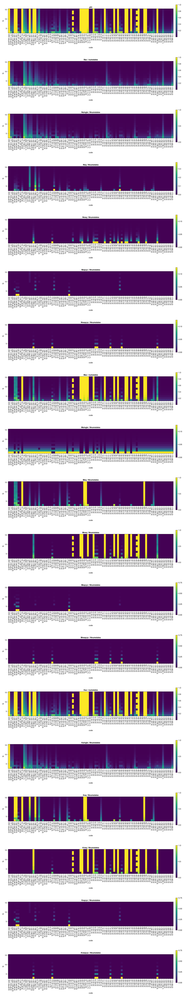

In [14]:
quants = [
    ("phi", df.phi),
    
    ("Nac / numstates", df.Nac ./ df.numstates),
    ("Nsingle / Nnumstates", df.Nsingle ./ df.numstates),
    ("Neq / Nnumstates", df.Neq ./ df.numstates),
    ("Nneq / Nnumstates", df.Nneq ./ df.numstates),
    ("Neqcyc / Nnumstates", df.Neqcyc ./ df.numstates),
    ("Nneqcyc / Nnumstates", df.Nneqcyc ./ df.numstates),
    
    ("Mac / numstates", df.Mac ./ df.numstates),
    ("Msingle / Nnumstates", df.Msingle ./ df.numstates),
    ("Meq / Nnumstates", df.Meq ./ df.numstates),
    ("Mneq / Nnumstates", df.Mneq ./ df.numstates),
    ("Meqcyc / Nnumstates", df.Meqcyc ./ df.numstates),
    ("Mneqcyc / Nnumstates", df.Mneqcyc ./ df.numstates),
    
    ("Kac / numstates", df.Kac ./ df.numstates),
    ("Ksingle / Nnumstates", df.Ksingle ./ df.numstates),
    ("Keq / Nnumstates", df.Keq ./ df.numstates),
    ("Kneq / Nnumstates", df.Kneq ./ df.numstates),
    ("Keqcyc / Nnumstates", df.Keqcyc ./ df.numstates),
    ("Kneqcyc / Nnumstates", df.Kneqcyc ./ df.numstates),
]

fig = Figure(size=(1400, 400*length(quants)))

for (i, (qname, q)) in enumerate(quants)
    ax = Axis(fig[i,1], aspect=DataAspect())
    p = heatmap!(ax, code_i, df.N, q;
        # colorscale=Makie.pseudolog10
    )
    Colorbar(fig[i,2], p)

    ax.title = qname
    
    ax.ylabel = "N"
    ax.xlabel = "code"
    ax.xticks = (1:length(codes), full_code_label.(codes; short=true, numenzymes=true))
    ax.xticklabelrotation = -pi/2
end

# save(datadir("ned_ca", "s1_bigplot_plog.pdf"), fig)
save(datadir("ned_ca", "s1_bigplot.pdf"), fig)
fig

# Looking by equilibrium parent

In [15]:
xx = unique(df.eqp_code)
yy = ca_numenzymes.(xx)
sp = sortperm(yy)
for i in sp
    println(@sprintf "%-20s -- numenzymes is %d" full_code_label(xx[i]) yy[i])
end

Rule 204 (eq,all)    -- numenzymes is 0
Rule 108 (eq,h)      -- numenzymes is 2
Rule 156 (eq,f)      -- numenzymes is 2
Rule 105 (eq,all)    -- numenzymes is 4
Rule 150 (eq,all)    -- numenzymes is 4
Rule 60 (eq)         -- numenzymes is 4
Rule 54 (eq,h)       -- numenzymes is 6
Rule 57 (eq,f)       -- numenzymes is 6
Rule 51 (eq,all)     -- numenzymes is 8


In [16]:
# make a selection of the df that is then plotted below
sdf =  df[df.eqp_code .== 57,:];
# sdf = df;
length(unique(sdf.code))

15

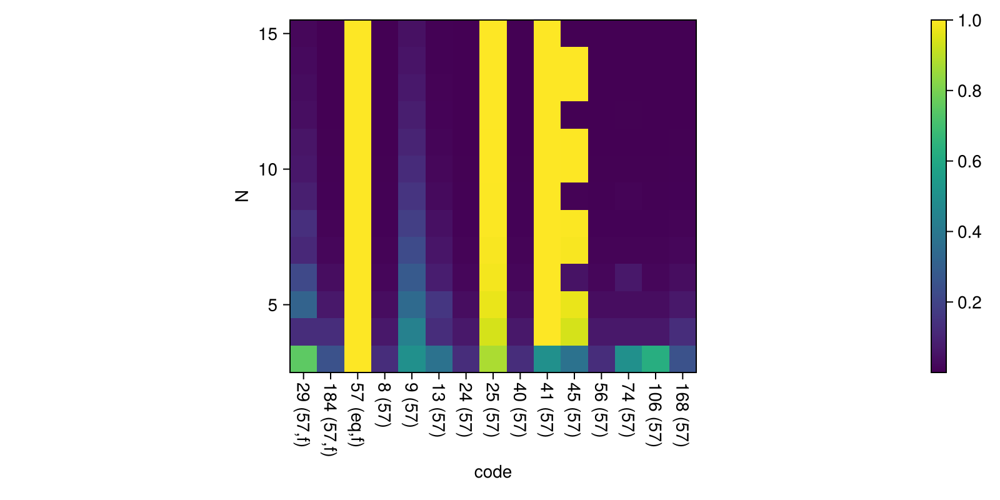

In [17]:
codes = unique(sdf.code)
code_i = map(c->findfirst(x->x==c, codes), sdf.code)

fig = Figure(size=(800, 400))
ax = Axis(fig[1,1], aspect=DataAspect())

# plot = scatter!(ax, code_i, sdf.N; color=sdf.phi, marker=:rect, markersize=20)
plot = heatmap!(ax, code_i, sdf.N, sdf.phi)
Colorbar(fig[1,2], plot)

ax.ylabel = "N"
ax.xlabel = "code"
ax.xticks = (1:length(codes), full_code_label.(codes; short=true))
ax.xticklabelrotation = -pi/2

fig

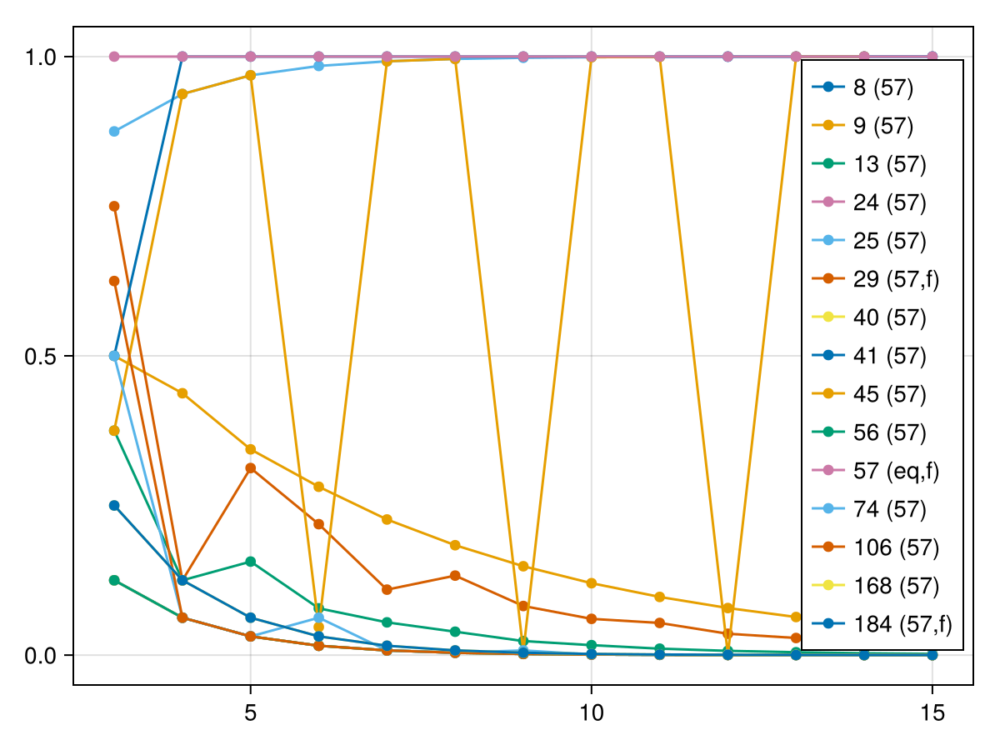

In [18]:
fig = Figure()
ax = Axis(fig[1,1];
    # yscale=Makie.pseudolog10
)
for gdf in groupby(sdf, :code)
    code = gdf.code[1]
    scatterlines!(ax, gdf.N, gdf.phi; label=full_code_label(code; short=true))
    # scatterlines!(ax, gdf.N, gdf.Nsingle ./ gdf.Nac; label=full_code_label(code; short=true))
end
axislegend(ax; position=:rc)
fig

# Bits and bobs

In [19]:
# Finding cases of phi == 1
xx = df[isapprox.(df.phi, 1.) .&& .!ca_iseq.(df.code) .&& df.N .> 3,:];
# unique(xx.code)
find_eq_parent_ucode.(unique(xx.code))

9-element Vector{Int64}:
 150
  51
  51
  51
  54
  57
  54
  54
 150